# Classificação de objetos

## 1. Requerimentos

Todas as bibliotecas já estão instaladas no Google Colab.

* OpenCV >= 3.4.3
* Matplotlib >= 3.1.3
* Seaborn >= 0.0.10
* Numpy >= 1.18.1
* Mediapipe==0.10.9

### 1.2 Arquivos

Baixe o repositório do GitHub utilizando o comando abaixo. Em caso de atualização, utilize o comando para apagar o diretório antes.

In [ ]:
!rm -rf fiap-ml-visao-computacional/

In [1]:
!git clone https://github.com/michelpf/fiap-ml-visao-computacional

Cloning into 'fiap-ml-visao-computacional'...
remote: Enumerating objects: 11662, done.
remote: Counting objects: 100% (230/230), done.
remote: Compressing objects: 100% (179/179), done.
remote: Total 11662 (delta 100), reused 155 (delta 46), pack-reused 11432
Receiving objects: 100% (11662/11662), 1.03 GiB | 11.88 MiB/s, done.
Resolving deltas: 100% (551/551), done.
Checking out files: 100% (573/573), done.


Vamos agora posicionar o diretório do repositório para a aula respectiva. Nesse caso envie o comando de mudança de diretório.

In [5]:
%cd fiap-ml-visao-computacional/aula-4-classificacao-objetos-analise-facial/

/content/fiap-ml-visao-computacional/aula-4-classificacao-objetos-analise-facial


Importação das bibliotecas.

In [41]:
import numpy as np
import pandas as pd

import glob
from tqdm import tqdm

import matplotlib.image as mpimg
import matplotlib.pyplot as plt

import seaborn as sns

import cv2

import math

# Scikit learn
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer
from sklearn import preprocessing
from sklearn.svm import SVC

#Exibição na mesma tela do Jupyter
%matplotlib inline

import datetime
import dlib

from scipy.spatial import distance as dist

plt.style.use('seaborn')
sns.set_style("whitegrid", {'axes.grid' : False})

Carregando um classificador pré-treinado de Haar.

Analise posteriormente outros classificadores disponíveis, dentre eles, classificador de pessoas, automóveis, gatos, sorriso, olhos, etc. neste repositório oficial do OpenCV https://github.com/opencv/opencv/tree/master/data/haarcascades.

## 2. Classificador de Viola-Jones

Este classificador é especializado em identificar faces, também é conhecido como classificador Viola James e pode ser utilizado em outras aplicações. O paper original pode ser baixado [aqui](https://www.cs.cmu.edu/~efros/courses/LBMV07/Papers/viola-cvpr-01.pdf). 

Devido a característica deste tipo de classificador, sua identificação é extramamente rápida, com identificação < 0,02s, aplicações em sistemas em tempo real, especialmente câmeras de vigilância.

### 2.1 Classificador de Faces

A aplicação mais utilizada do classificador em cascata de Viola-Jones (ou classificador de Haar) é para encontrar faces em imagens ou vídeos, especialmente por sua identificação ser bem rápida.

Este tipo de classificador serve para separar a região de interesse de uma determinada área, para posteriormente, aplicar outros classificadores que poderão, por exemplo, classificar de quem é o rosto, uma vez que a região foi separado da imagem original.

In [ ]:
# Carregando classifcador
classificador_face = cv2.CascadeClassifier('classificadores/haarcascade_frontalface_default.xml')

imagem = cv2.imread('imagens/purchase.jpg')
#imagem = cv2.imread('imagens/college.jpg')

imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
imagem_gray = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)

(-0.5, 1279.5, 852.5, -0.5)

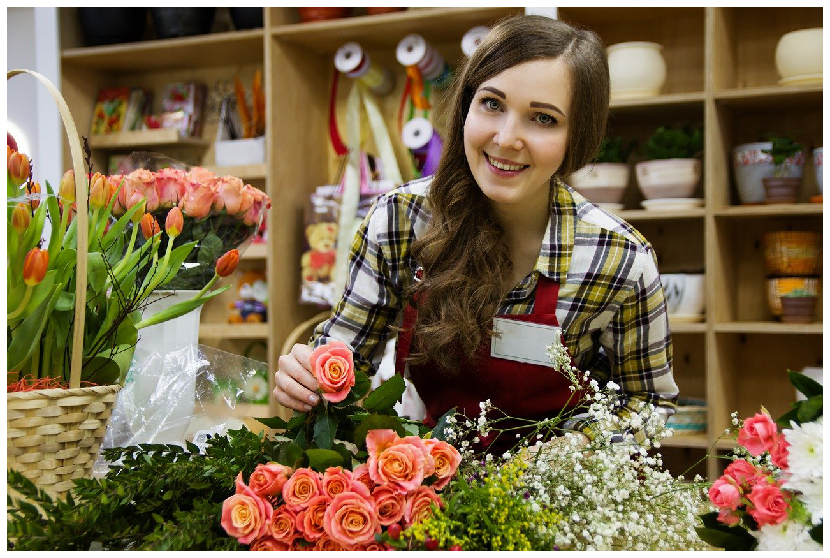

In [ ]:
plt.figure(figsize=(20,10))
plt.imshow(imagem)
plt.axis("off")

Text(0.5, 1.0, 'Faces identificadas')

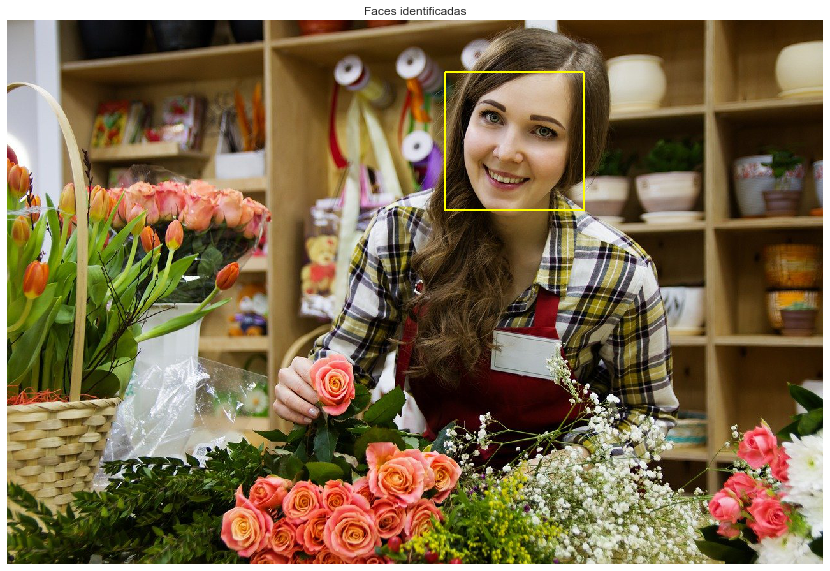

In [ ]:
# Retornará a região de interesse da face identificada como tupla, armazenando as coordenadas superiores esquerda e inferior 
# direita.
# Se retornar vazio é por que não há faces identificadas.
# Os valores padrão são configurações inciais recomendadas 
# (cv.HaarDetectObjects(image, cascade, storage, scale_factor=1.1, min_neighbors=3, flags=0, min_size=(0, 0)))

faces = classificador_face.detectMultiScale(imagem_gray, 1.3, 5)

# Lista de faces. Caso não seja identificada será retornado None (nulo)
if faces is None:
     cv2.putText(imagem, "Rosto ausente", (50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,0), 6)
    
# Desenhando retângulos nos rostos identificados
for i, (x,y,w,h) in enumerate(faces):
    #roi = imagem[y:y+h, x:x+w]
    #roi = cv2.cvtColor(roi, cv2.COLOR_RGB2BGR)
    
    cv2.imwrite("face_" + str(i) + ".png", roi)
    cv2.rectangle(imagem, (x,y), (x+w,y+h), (255,255,0), 2)
    
plt.figure(figsize=(20,10))
plt.imshow(imagem)
plt.axis('off')
plt.title("Faces identificadas")

Construindo funções para utilizar de forma modular em análise de imagens ou vídeos. 

Optamos por criar 2 versões da mesma função, sendo a com o sufixo **rgb** espera como parâmetro de entrada uma imagem neste formato. A outra função espera como imagem de entrada no formato **bgr**, que é o formato padrão para escrita de vídeo.

Função de análise e inferência para imagens ou frames no formato RGB.

In [ ]:
classificador_face = cv2.CascadeClassifier('classificadores/haarcascade_frontalface_default.xml')

def identificar_rosto_rgb(imagem):
    
    imagem_gray = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)
    faces = classificador_face.detectMultiScale(imagem_gray, 1.2, 5)

    for (x,y,w,h) in faces:
        cv2.rectangle(imagem, (x,y), (x+w,y+h), (255,255,0), 2)

    return imagem

Aplicando a uma imagem coletada de uma câmera.

In [ ]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

In [ ]:
from IPython.display import Image
try:
  filename = take_photo("imagens/foto.jpg")
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

In [ ]:
imagem = cv2.imread("imagens/foto.jpg")
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
imagem_rosto = identificar_rosto_rgb(imagem)

plt.figure(figsize=(20,10))
plt.imshow(imagem_rosto, cmap="gray")
plt.title("Imagem com rosto")

### 2.2 Classificador de Gatos 

Este classificador identifica pessoas (corpos inteiros). Sua utilidade é para segmentar e localizar uma ou mais pessoas em uma determinada cena.

Repare que pessoas muito próximas uma das outras prejudica a identificação. Em vídeos de vigilância, este aspecto negativo é diminuído, pois ha muitas oportunidades do classificador inferir, e conseguir identificar as pessoas em outros momentos onde estão mais separadas umas das outroas.

Função de análise e inferência para imagens ou frames no formato RGB.

In [ ]:
def identificar_gato_rgb(imagem):
    classificador_pessoas = cv2.CascadeClassifier('classificadores/haarcascade_frontalcatface_extended.xml')
    
    imagem_gray = cv2.cvtColor(imagem, cv2.COLOR_RGB2GRAY)
    pessoas = classificador_pessoas.detectMultiScale(imagem_gray, 1.1, 3)

    for (x,y,w,h) in pessoas:
        roi = imagem[y:y+h, x:x+w]
        area = int(w) * int(h)
        cv2.rectangle(imagem, (x,y), (x+w,y+h), (255,255,0), 2)
        
    return imagem

(-0.5, 1457.5, 1253.5, -0.5)

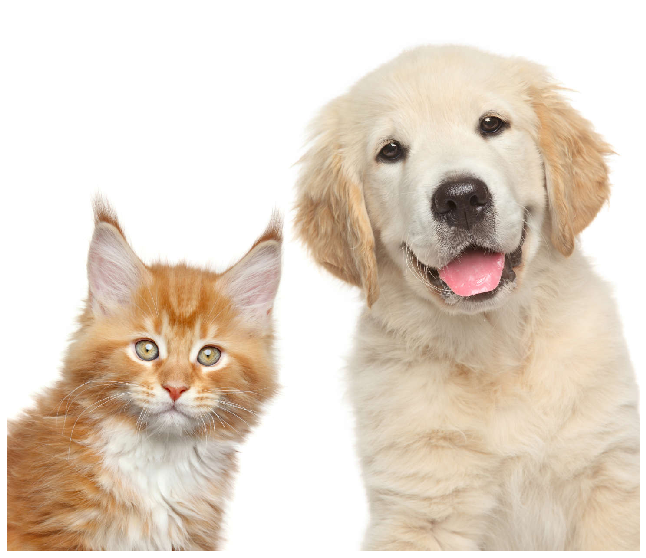

In [ ]:
imagem = cv2.imread("imagens/cat-dog.jpg")
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.imshow(imagem)
plt.axis('off')

(-0.5, 1457.5, 1253.5, -0.5)

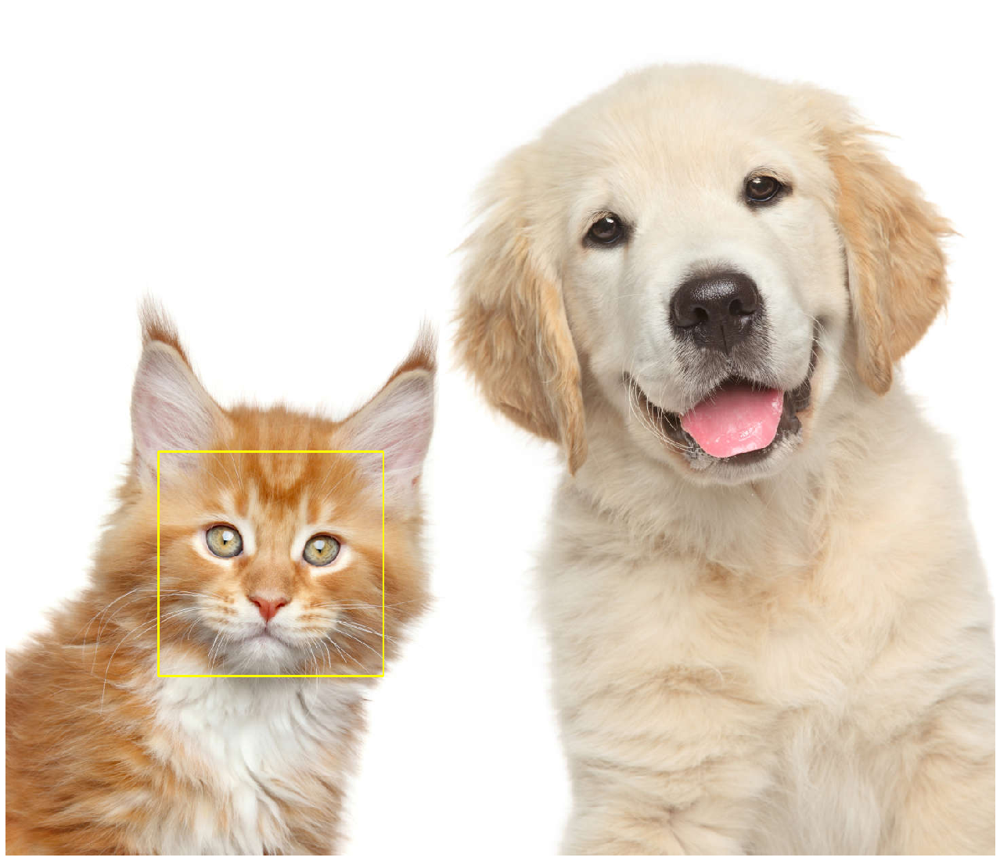

In [ ]:
imagem_proc = identificar_gato_rgb(imagem)

plt.figure(figsize=(30,20))
plt.imshow(imagem_proc)
plt.axis('off')

### 2.3 Classificador em Cascata Customizado

Construir um classificador em cascata especializado consiste em reunir imagens de treino positivas e negativas, diferentemente de outros tipos de classificadores, como por exemplo os de _deep learning_. 

O processo de construção é realizado por meio de utilitários em linha de comando do OpenCV, que apesar de não ser complexo pode envolver uma dedicação maior. Por tal razão, vamos optar pelo [Cascade Trainer GUI](http://amin-ahmadi.com/cascade-trainer-gui/), de Amin Ahmadi, criado para ser executado em Windows que facilita muito este processo. http://amin-ahmadi.com/cascade-trainer-gui/.

As imagens para as etapas de treino podem ser baixadas em http://www.dis.uniroma1.it/~labrococo/?q=node/459. 

Função de análise e inferência para imagens ou frames no formato RGB.

In [ ]:
ball_classifier = cv2.CascadeClassifier("ball/classifier/cascade.xml")

def identificar_bola_rgb(imagem):
    
    gray = cv2.cvtColor(imagem, cv2.COLOR_RGB2GRAY)
    balls = ball_classifier.detectMultiScale(gray, 1.3, 3)

    for (x,y,w,h) in balls:
        cv2.rectangle(imagem, (x,y), (x+w,y+h), (255,255,0), 1)
        
    return imagem

(-0.5, 639.5, 359.5, -0.5)

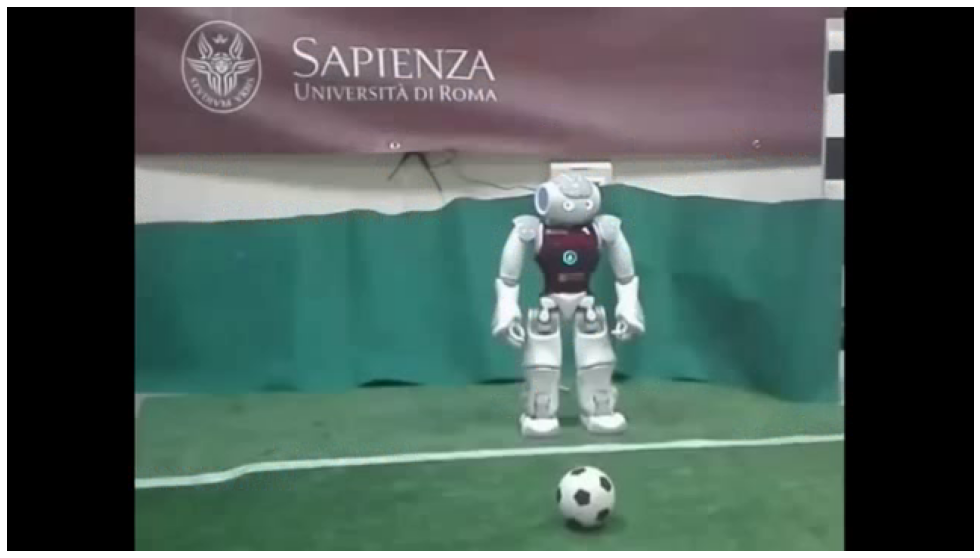

In [ ]:
imagem = cv2.imread("imagens/soccer-ball.png")
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.imshow(imagem)
plt.axis('off')

(-0.5, 639.5, 359.5, -0.5)

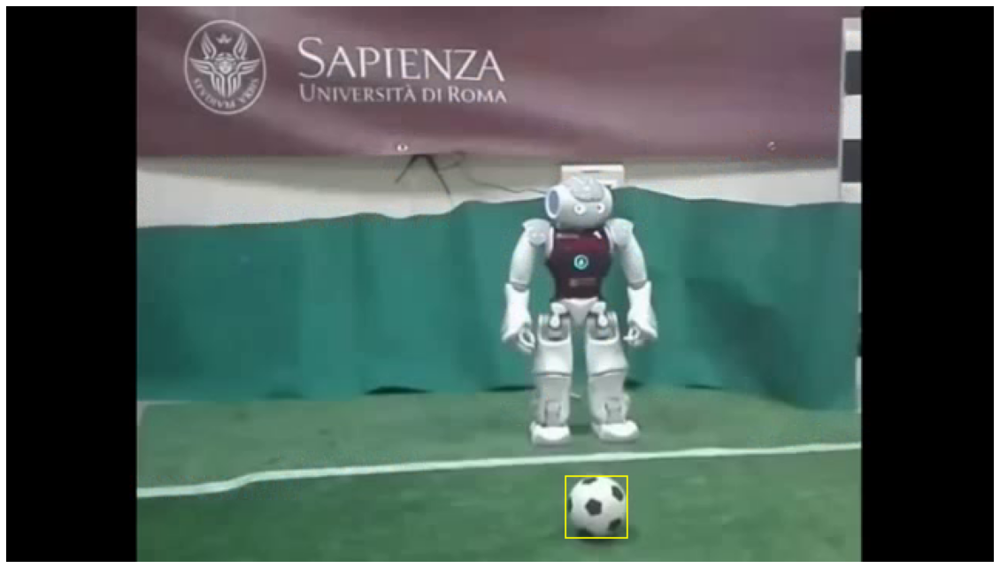

In [ ]:
imagem_proc = identificar_bola_rgb(imagem)

plt.figure(figsize=(20,20))
plt.imshow(imagem_proc)
plt.axis('off')

## 3. Identificação de Marcos Faciais

O toolkit [Dlib](http://dlib.net) fornece uma série de bibliotecas e ferramentas para utilização em problemas de visão computacional. Para o uso de identificação de marcos faciais vamos utilizar sua biblioteca responsável por identificar faces de uma imagem e posterior identificação dos marcos faciais.

O Dlib vem instalado por padrão na plataforma Google Colab, não é necesário baixar.

Os modelos podem ser baixados neste endereço http://dlib.net/files/. Os que serão utilizados estão já incluídos na pasta ```modelos```.

Iniciamos o processo de identificação configurando o modelo treinado de 68 pontos ```shape_predictor_68_face_landmarks.dat```. Após isso precisamos identificar a face e para cada face identificada retornar a lista de pontos, na variável ```marcos_faciais```.

In [6]:
classificador_68_path = "modelos/shape_predictor_68_face_landmarks.dat"
classificador_5_path = "modelos/shape_predictor_5_face_landmarks.dat"

classificador_dlib_68 = dlib.shape_predictor(classificador_68_path)
classificador_dlib_5 = dlib.shape_predictor(classificador_5_path)

detector_face_dlib = dlib.get_frontal_face_detector()

def obter_marcos(imagem, marcos_68_pontos=True):
    
    classificador_dlib = classificador_dlib_68
    
    if marcos_68_pontos is False:
        classificador_dlib = classificador_dlib_5
        
    faces = detector_face_dlib(imagem, 1)

    if len(faces) == 0:
        return None
        
    marcos_faciais = []
    pontos_x, pontos_y, pontos = [], [], []

    for face in faces:
      shape = classificador_dlib_68(imagem, face)

      for i in range(0, 68):
        pontos_x.append(shape.part(i).x)
        pontos_y.append(shape.part(i).y)
        pontos.append([shape.part(i).x, shape.part(i).y])

      pontos = np.matrix(pontos)

      marcos_faciais.append(pontos)

    return marcos_faciais

Com os pontos mapeados, o próximo passo é criar uma função para anotar em uma nova imagem.

In [8]:
def anotar_marcos(imagem, marcos_faciais):
    
    if marcos_faciais is None:
        print("Não foi identificado nenhum marco facial.")
        return imagem
    
    for marco_facial in marcos_faciais:
        for idx, ponto in enumerate(marco_facial):
            centro = (ponto[0,0], ponto[0,1])

            cv2.circle(imagem, centro, 3, (0, 255, 255), -1)
            
    return imagem

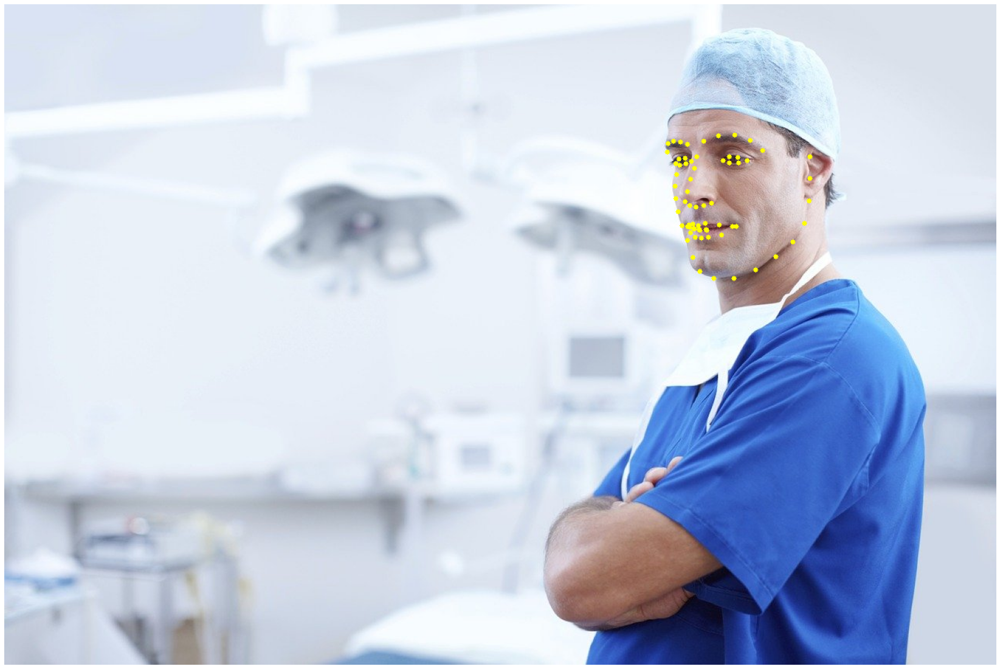

In [9]:
imagem = cv2.imread("imagens/doctor.jpg")

marcos_faciais = obter_marcos(imagem)
imagem_marcos = anotar_marcos(imagem, marcos_faciais)

imagem_marcos = cv2.cvtColor(imagem_marcos, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(30,20))
plt.axis('off')
plt.imshow(imagem_marcos)

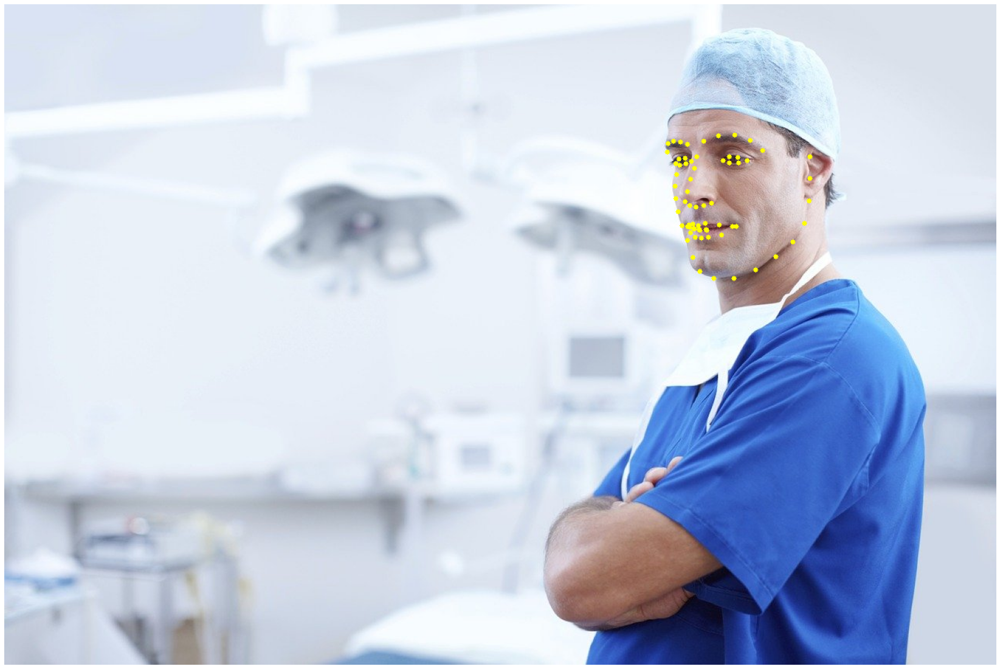

In [10]:
imagem = cv2.imread("imagens/doctor.jpg")

marcos_faciais = obter_marcos(imagem, False)
imagem_marcos = anotar_marcos(imagem, marcos_faciais)

imagem_marcos = cv2.cvtColor(imagem_marcos, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(30,20))
plt.axis('off')
plt.imshow(imagem_marcos)

Aplicando a detecção e anotação utilizando uma câmera.

In [ ]:
from IPython.display import Image
try:
  filename = take_photo("imagens/foto.jpg")
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

In [ ]:
imagem = cv2.imread("imagens/foto.jpg")

marcos_faciais = obter_marcos(imagem)
imagem_marcos = anotar_marcos(imagem, marcos_faciais)

imagem_marcos = cv2.cvtColor(imagem_marcos, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(30,20))
plt.axis('off')
plt.imshow(imagem_marcos)
plt.title("Marcos faciais da câmera")

### 3.1 Análise de Marcos Faciais

Os 68 pontos estão divididos nos seguintes coponentes do rosto humano:

* Face completa ```1 ao 68```
* Sombrancelha direita ```17 ao 21```
* Sombracelha esquerda ```22 ao 26```
* Olho direito ```36 ao 41```
* Olho esquerdo ```42 ao 47```
* Nariz ```27 ao 34```
* Lábio ```48 ao 60```
* Lábio exterior ``47 a 60``
* Lábio interior ``59 a 67``  
* Mandíbula ```1 ao 16```

Os pontos que o DLib retorna são zero based, portanto o primeiro ponto começa no 0.

In [23]:
FACE_COMPLETA = list(range(0, 68))
SOMBRANCELHA_DIREITA = list(range(17, 22))
SOMBRANCELHA_ESQUERDA = list(range(22, 27))
OLHO_DIREITO = list(range(36, 42))
OLHO_ESQUERDO = list(range(42, 48))
NARIZ = list(range(27, 35))
LABIO = list(range(48, 61))
LABIO_EXTERIOR = list(range(48, 61))
LABIO_INTERIOR = list(range(60, 68))
MANDIBULA = list(range(0, 17))

Função para criar polígonos a partir dos pontos de identificação. Estes polígonos podem oferecer ferramentas como cálculo de área para identificação melhor das estruturas faciais, como piscadas, movimentação da boca, dentre outros.

In [12]:
def anotar_marcos_faciais_componente(imagem, marcos_faciais):

    if marcos_faciais is None:
        print("Não foi identificado nenhum marco facial.")
        return imagem
    
    for marco_facial in marcos_faciais:
        for d in marco_facial:

            pontos = cv2.convexHull(marco_facial[LABIO])
            cv2.drawContours(imagem, [pontos], 0, (0, 255, 0), 2)

            pontos = cv2.convexHull(marco_facial[OLHO_ESQUERDO])
            cv2.drawContours(imagem, [pontos], 0, (0, 255, 0), 2)

            pontos = cv2.convexHull(marco_facial[OLHO_DIREITO])
            cv2.drawContours(imagem, [pontos], 0, (0, 255, 0), 2)

    return imagem

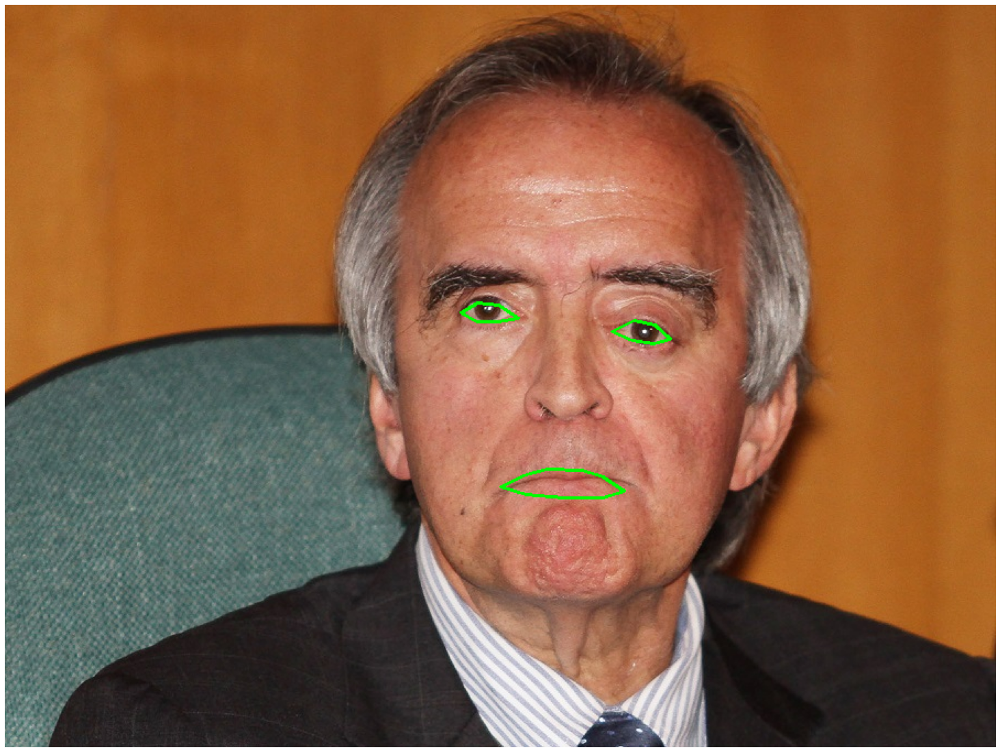

In [13]:
imagem = cv2.imread("imagens/cervero.jpeg")

marcos_faciais = obter_marcos(imagem)
imagem_marcos = anotar_marcos_faciais_componente(imagem, marcos_faciais)

imagem_marcos = cv2.cvtColor(imagem_marcos, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(30,20))
plt.axis('off')
plt.imshow(imagem_marcos)

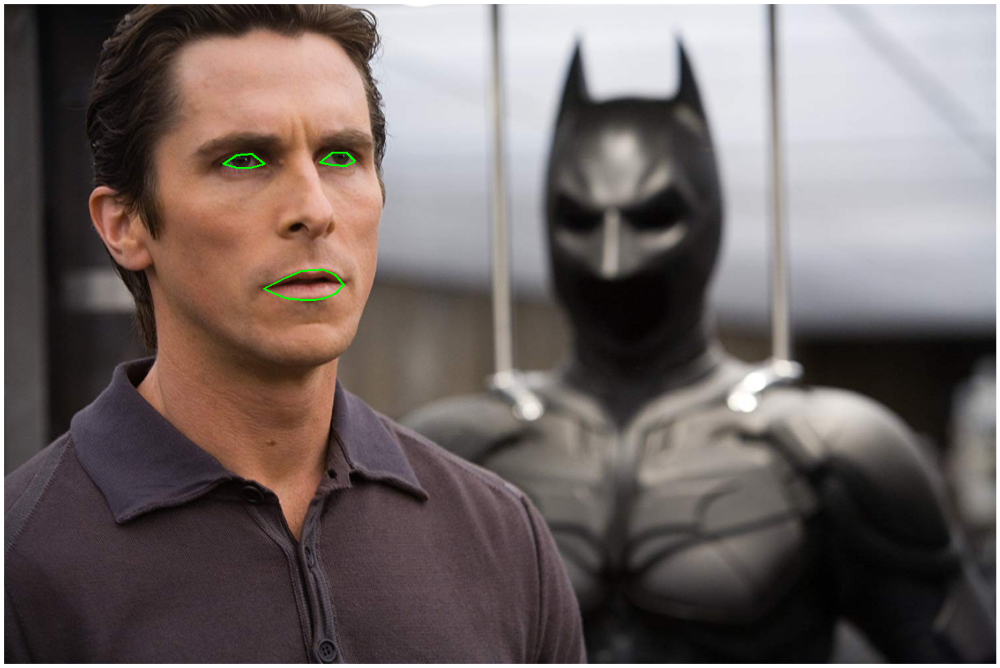

In [14]:
imagem = cv2.imread("imagens/bruce.jpg")

marcos_faciais = obter_marcos(imagem)
imagem_marcos = anotar_marcos_faciais_componente(imagem, marcos_faciais)

imagem_marcos = cv2.cvtColor(imagem_marcos, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(30,20))
plt.axis('off')
plt.imshow(imagem_marcos)

Para lidar com situações onde o rosto capturado pode se aproximar ou se afastar da câmera utilizamos um cálculo de aspecto de razão. Esse cálculo divide duas medidas e sua razão é utilizada como medida para análises.

Uma vez que temos os pontos em volta de cada componente do rosto humano é possível realizar essas medidas de aspecto de razão para analisar a abertura dos olhos, por exemplo.

Nesse sentido, calculamos a medida de aspecto razão dos olhos ou EAR. Essa medida foi discutida neste [paper de Soukupová and Čech](http://vision.fe.uni-lj.si/cvww2016/proceedings/papers/05.pdf).

In [15]:
def ear(pontos_olho):
    
    a = dist.euclidean(pontos_olho[1], pontos_olho[5])
    b = dist.euclidean(pontos_olho[2], pontos_olho[4])
    c = dist.euclidean(pontos_olho[0], pontos_olho[3])

    medida_ear = (a + b) / (2.0 * c)

    return medida_ear

Vamos inspecionar a abertura dos olhos da imagem analisada. Note que como existe apenas uma única pessoa (ou rosto) na imagem,  utilizaremos o índice 0 somente. Se houvessem mais pessoas, poderíamos analisar cada uma delas iterando sobre o índice.

In [16]:
ear_olho_direito = ear(marcos_faciais[0][OLHO_DIREITO])
ear_olho_esquerdo = ear(marcos_faciais[0][OLHO_ESQUERDO])

print("EAR do olho esquerdo " + str(ear_olho_esquerdo))
print("EAR do olho direito " + str(ear_olho_direito))

EAR do olho esquerdo 0.3679107605520252
EAR do olho direito 0.32277254872281164


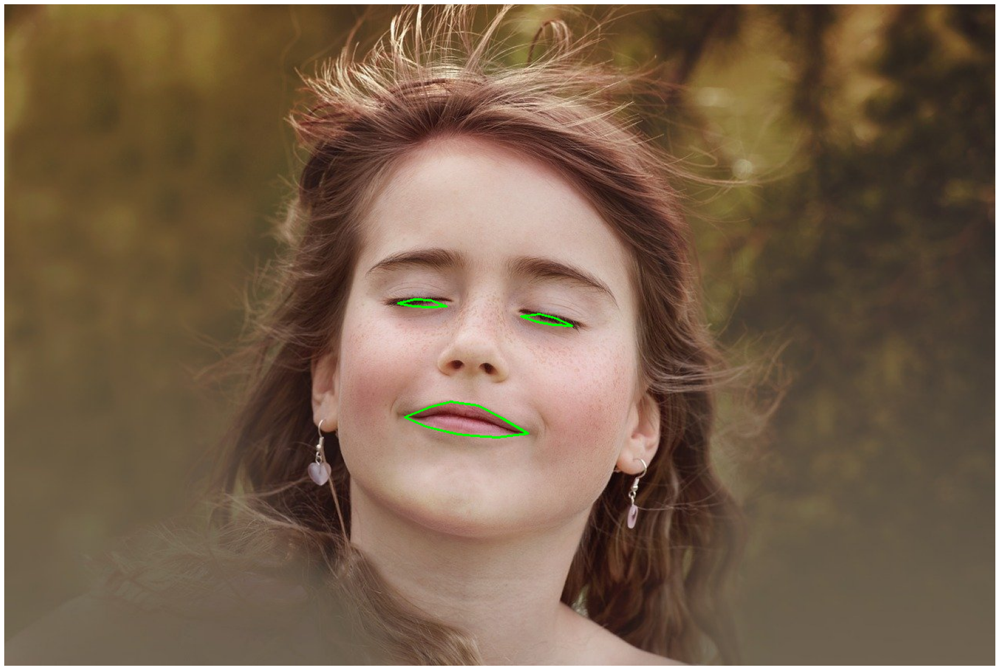

In [17]:
imagem = cv2.imread("imagens/person-closed-yes.jpg")

marcos_faciais = obter_marcos(imagem)
imagem_marcos = anotar_marcos_faciais_componente(imagem, marcos_faciais)

imagem_marcos = cv2.cvtColor(imagem_marcos, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(30,20))
plt.axis('off')
plt.imshow(imagem_marcos)

In [ ]:
ear_olho_direito = ear(marcos_faciais[0][OLHO_DIREITO])
ear_olho_esquerdo = ear(marcos_faciais[0][OLHO_ESQUERDO])

print("EAR do olho esquerdo " + str(ear_olho_esquerdo))
print("EAR do olho direito " + str(ear_olho_direito))

EAR do olho esquerdo 0.14653587729315268
EAR do olho direito 0.14474766078335896


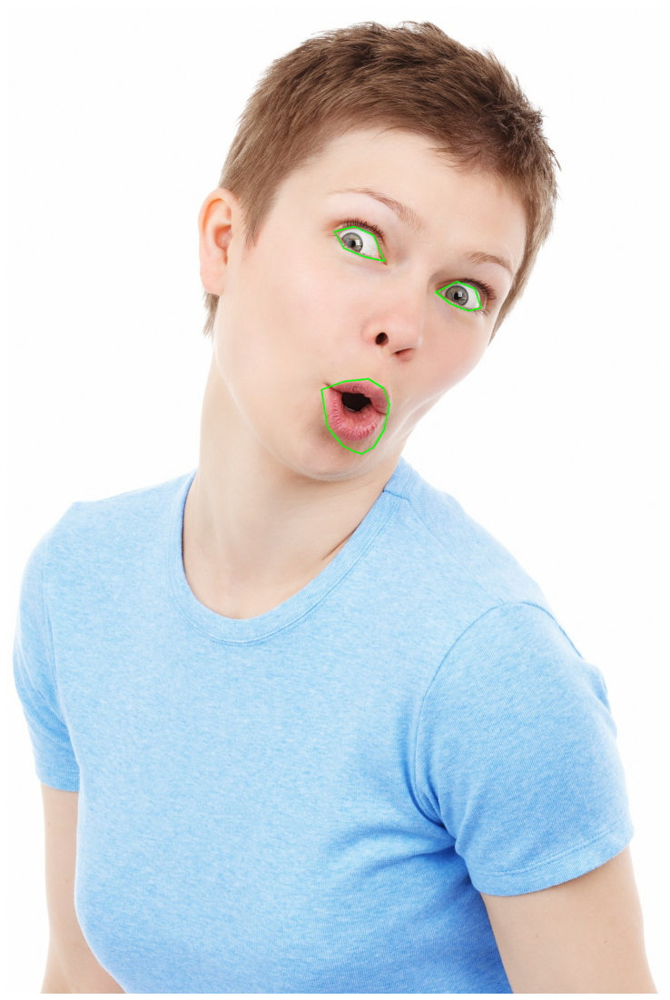

In [ ]:
imagem = cv2.imread("imagens/amazed.jpg")

marcos_faciais = obter_marcos(imagem)
imagem_marcos = anotar_marcos_faciais_componente(imagem, marcos_faciais)

imagem_marcos = cv2.cvtColor(imagem_marcos, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(30,20))
plt.axis('off')
plt.imshow(imagem_marcos)

In [ ]:
ear_olho_direito = ear(marcos_faciais[0][OLHO_DIREITO])
ear_olho_esquerdo = ear(marcos_faciais[0][OLHO_ESQUERDO])

print("EAR do olho esquerdo " + str(ear_olho_esquerdo))
print("EAR do olho direito " + str(ear_olho_direito))

EAR do olho esquerdo 0.4831736054400988
EAR do olho direito 0.4098092330830741


Aplicar a análise de face e marcos faciais utilizando a câmera.

In [ ]:
from IPython.display import Image
try:
  filename = take_photo("imagens/foto.jpg")
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

In [ ]:
imagem = cv2.imread("imagens/foto.jpg")

marcos_faciais = obter_marcos(imagem)
imagem_marcos = anotar_marcos_faciais_componente(imagem, marcos_faciais)

imagem_marcos = cv2.cvtColor(imagem_marcos, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(30,20))
plt.axis('off')
plt.imshow(imagem_marcos)
plt.title("Marcos faciais com 68 pontos")

In [ ]:
ear_olho_direito = ear(marcos_faciais[0][OLHO_DIREITO])
ear_olho_esquerdo = ear(marcos_faciais[0][OLHO_ESQUERDO])

print("EAR do olho esquerdo " + str(ear_olho_esquerdo))
print("EAR do olho direito " + str(ear_olho_direito))

### 3.2 Alinhamento de faces

Uma técnica de pré-processamento de imagens contendo faces humanas é o alinhamento dos olhos. Esta técnica torna as regiões entre as difernetes imagens em uma mesma localização espacial, o que torna o aprendizado de reconhecimento de faces mais efetivo.

In [18]:
def extrair_olho(shape, eye_indices):
    points = map(lambda i: shape.part(i), eye_indices)
    return list(points)

def extrair_olho_centro(shape, eye_indices):
    points = extrair_olho(shape, eye_indices)
    xs = map(lambda p: p.x, points)
    ys = map(lambda p: p.y, points)
    return sum(xs) // 6, sum(ys) // 6

def extrair_olho_centro_esquerdo(shape):
    return extrair_olho_centro(shape, OLHO_ESQUERDO)

def extrair_olho_centro_direito(shape):
    return extrair_olho_centro(shape, OLHO_DIREITO)

def angulo_entre_pontos(p1, p2):
    x1, y1 = p1
    x2, y2 = p2
    tan = (y2 - y1) / (x2 - x1)
    return np.degrees(np.arctan(tan))

def get_rotation_matrix(p1, p2):
    angle = angulo_entre_pontos(p1, p2)
    x1, y1 = p1
    x2, y2 = p2
    xc = (x1 + x2) // 2
    yc = (y1 + y2) // 2
    M = cv2.getRotationMatrix2D((xc, yc), angle, 1)
    return M

def align_face(image_path, tamanho=None, return_face=False):
  imagem = cv2.imread(image_path)
  imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

  height, width = imagem.shape[:2]
  dets = detector_face_dlib(imagem, 1)

  if len(dets) == 0:
    return None
  
  for i, det in enumerate(dets):

      x = det.left()
      y = det.top()
      w = det.right() - x
      h = det.bottom() - y

      if x < 0: x = 0
      if y < 0: y = 0

      roi = imagem[y:y+h, x:x+w]

      shape = classificador_dlib_68(imagem, det)
      left_eye = extrair_olho_centro_esquerdo(shape)
      right_eye = extrair_olho_centro_direito(shape)

      M = get_rotation_matrix(left_eye, right_eye)

      if tamanho:
        width = tamanho[0]
        height = tamanho[1]
        
      rotated = cv2.warpAffine(imagem, M, (width, height))

      cropped = rotated[y:y+h, x:x+w]

  if return_face:
    return cropped

  plt.subplot(1,2,1)
  plt.title("Original")
  plt.imshow(roi)

  plt.subplot(1,2,2)
  plt.title("Alinhado")
  plt.imshow(cropped)

  plt.show()

achei


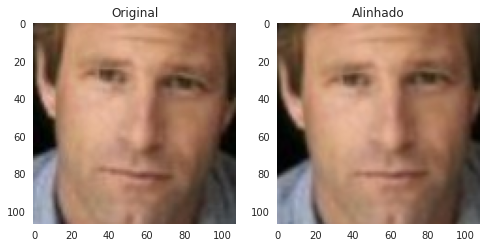

In [ ]:
align_face("imagens/Aaron_Eckhart_0001.jpg")

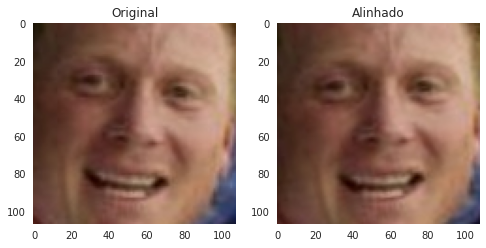

In [ ]:
align_face("imagens/Aaron_Guiel_0001.jpg")

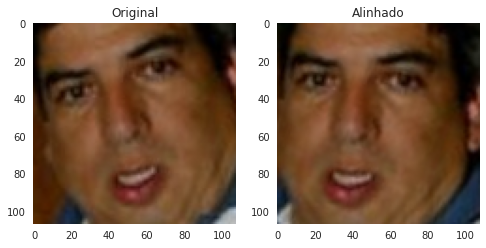

In [ ]:
align_face("imagens/Aaron_Pena_0001.jpg")

# Face Landmarks

MediaPipe Face Landmarker permite detectar pontos de referência e expressões faciais em imagens e vídeos.  

Você pode usar esta tarefa para identificar expressões faciais humanas, aplicar filtros e efeitos faciais e criar avatares virtuais.  

In [ ]:
import cv2
import itertools
import numpy as np
from time import time
import mediapipe as mp
import matplotlib.pyplot as plt
import requests

Função para baixar uma imagem para aplicar mediapipe face landmarks

In [ ]:
def download_image(url, save_path):
    try:
        response = requests.get(url)
        response.raise_for_status()

        with open(save_path, 'wb') as file:
            file.write(response.content)

        print(f"Imagem baixada com sucesso para {save_path}")

    except requests.exceptions.RequestException as e:
        print(f"Erro ao baixar a imagem: {e}")

In [ ]:
image_url = "https://static1.purepeople.com.br/articles/1/32/04/81/@/3615081-faustao-tem-preocupado-amigos-mais-intim-580x0-1.jpg"
save_path = "imagem.jpg"

download_image(image_url, save_path)

In [ ]:
sample_img = cv2.imread('imagem.jpg')

plt.figure(figsize = [10, 10])

plt.title("Sample Image");plt.axis('off');plt.imshow(sample_img[:,:,::-1]);plt.show()

Inicializar o modelo para a inicialização da detecção de pontos faciais:  método face_mesh da classe do Mediapipe.  

No método face_mesh, temos nossa função principal que realizará a detecção de pontos de referência que é FaceMesh(), abaixo temos alguns argumentos sobre o FaceMesh():

* **static_image_mode**: Este argumento aceita apenas dois tipos booleanos de valores (Verdadeiro ou Falso).  Se definirmos o argumento como False então detectará os frames e não na forma de imagens, ou seja, no formato de streaming de vídeo, o que pode ser útil quando tentarmos detectar os pontos de referência faciais em tempo real, mas neste caso nós queremos detectar os pontos de referência nas imagens, por isso usaremos True como parâmetro.  O valor padrão é falso.

* **max_num_faces**: Este argumento especificará quantas faces o modelo deve detectar na imagem ou quadro em uma instância específica, ou seja, em um quadro/imagem o modelo pode detectar mais de uma face, é necessário um tipo de valor inteiro, ou seja, valor numérico e o valor padrão é 1 (apenas um rosto a ser detectado).

* **min_detection_confidence**: Este argumento serve basicamente para definir o valor limite para a confiança de detecção do modelo, ou seja, o quanto nosso modelo está confiante de que na imagem/quadro detectou todas as posições dos pontos de referência.  O intervalo típico de valores adotado é [0.0,1.0] e o valor padrão é 0,5, ou seja, a confiança de detecção é definida como 50% de confiança.

* **min_tracking_confidence**: Este argumento será ignorado quando o parâmetro static_image_mode for definido como True, que é o caso das imagens, o valor padrão deste argumento é 0,5, ou seja, 50% de confiança de rastreamento, o que também melhora a robustez do processo de detecção.

In [ ]:
mp_face_mesh = mp.solutions.face_mesh

face_mesh_images = mp_face_mesh.FaceMesh(static_image_mode=True, max_num_faces=2,
                                         min_detection_confidence=0.5)

mp_drawing = mp.solutions.drawing_utils

mp_drawing_styles = mp.solutions.drawing_styles

Agora que inicializamos nosso modelo é hora de realizar a detecção de pontos de referência com base no pré-processamento anterior e com a ajuda da função de processo do FaceMesh obteremos os 468 pontos de referência faciais na imagem.

In [ ]:
face_mesh_results = face_mesh_images.process(sample_img[:,:,::-1])  # BGR to RGB


# coordenadas dos olhos
LEFT_EYE_INDEXES = list(set(itertools.chain(*mp_face_mesh.FACEMESH_LEFT_EYE)))
RIGHT_EYE_INDEXES = list(set(itertools.chain(*mp_face_mesh.FACEMESH_RIGHT_EYE)))

# Existe um rosto na iamgem?
if face_mesh_results.multi_face_landmarks:
    # Interar sobre as faces encontradas
    for face_no, face_landmarks in enumerate(face_mesh_results.multi_face_landmarks):

        print(f'FACE NUMBER: {face_no+1}')
        print('-----------------------')

        print(f'LEFT EYE LANDMARKS:n')

        for LEFT_EYE_INDEX in LEFT_EYE_INDEXES[:2]:

            print(face_landmarks.landmark[LEFT_EYE_INDEX])

        print(f'RIGHT EYE LANDMARKS:n')

        for RIGHT_EYE_INDEX in RIGHT_EYE_INDEXES[:2]:

            print(face_landmarks.landmark[RIGHT_EYE_INDEX])

Usaremos os valores que obtidos do processamento anterior e vamos usá-los para desenhar o resultado na imagem usando draw_landmarks()

Antes de prosseguir com o código, vamos primeiro entender os argumentos da função draw_landmarks().

* **image**: Este argumento pegará a imagem que estará no formato RGB na qual precisamos desenhar os pontos de referência.

* **marks_list**: Esta lista consistirá em todos os pontos de referência, mas no formato normalizado.

* **connection**: Como o nome sugere, este argumento terá uma lista de argumentos que nos dirão como os pontos de referência faciais serão conectados quando os desenharmos na imagem.

* **landmark_drawing_spec**: Este argumento define o básico do desenho, ou seja, selecionará a cor, a espessura das linhas e o raio do círculo dos pontos de referência que serão desenhados na imagem.

* **connection_drawing_spec**: Como vimos no argumento de conexão, temos a lista de pontos de referência que conectarão outros pontos faciais, então aqui definiremos as configurações de desenho das linhas de conexão.

img_copy = sample_img[:,:,::-1].copy()

if face_mesh_results.multi_face_landmarks:

    for face_landmarks in face_mesh_results.multi_face_landmarks:

        mp_drawing.draw_landmarks(image=img_copy,
                                  landmark_list=face_landmarks,connections=mp_face_mesh.FACEMESH_TESSELATION,
                                  landmark_drawing_spec=None,
                                  connection_drawing_spec=mp_drawing_styles.get_default_face_mesh_tesselation_style())

        mp_drawing.draw_landmarks(image=img_copy, landmark_list=face_landmarks,connections=mp_face_mesh.FACEMESH_CONTOURS,
                                  landmark_drawing_spec=None,
                                  connection_drawing_spec=mp_drawing_styles.get_default_face_mesh_contours_style())

fig = plt.figure(figsize = [10, 10])
plt.title("Resultant Image");plt.axis('off');plt.imshow(img_copy);plt.show()

# Detecção de Bocejo

In [ ]:
image_url = "https://chc.org.br/wp-content/uploads/2022/07/natureza_1.jpg"
save_path = "imagem.jpg"

download_image(image_url, save_path)

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import mediapipe as mp

def desenhar_landmarks(imagem, landmarks):
    for landmark in landmarks:
        x, y = int(landmark.x * width), int(landmark.y * height)
        cv2.circle(imagem, (x, y), 2, (255, 0, 0), -1)

def detectar_bocejo(image_path):
    # Inicializar o MediaPipe Face Detection
    mp_face_detection = mp.solutions.face_detection
    face_detection = mp_face_detection.FaceDetection(min_detection_confidence=0.3)

    # Inicializar o MediaPipe Face Mesh
    mp_face_mesh = mp.solutions.face_mesh
    face_mesh = mp_face_mesh.FaceMesh()

    # Ler a imagem
    imagem = cv2.imread(image_path)
    global height, width  # Precisamos tornar height e width variáveis globais para usá-las na função desenhar_landmarks
    height, width, _ = imagem.shape

    # Converter a imagem para RGB (MediaPipe usa RGB)
    imagem_rgb = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

    # Detecção de rostos
    results_detection = face_detection.process(imagem_rgb)
    if results_detection.detections:
        for detection in results_detection.detections:
            bboxC = detection.location_data.relative_bounding_box
            ih, iw, _ = imagem.shape
            bbox = int(bboxC.xmin * iw), int(bboxC.ymin * ih), \
                   int(bboxC.width * iw), int(bboxC.height * ih)

            # Detecção de landmarks faciais
            results_mesh = face_mesh.process(imagem_rgb)
            if results_mesh.multi_face_landmarks:
                for face_landmarks in results_mesh.multi_face_landmarks:
                    # Ponto 13 e 14 correspondem à parte superior e inferior da boca
                    ponto_superior_boca = face_landmarks.landmark[13]
                    ponto_inferior_boca = face_landmarks.landmark[14]

                    # Coordenadas normalizadas para coordenadas de pixels
                    x_superior, y_superior = int(ponto_superior_boca.x * width), int(ponto_superior_boca.y * height)
                    x_inferior, y_inferior = int(ponto_inferior_boca.x * width), int(ponto_inferior_boca.y * height)

                    # Calcular a altura da boca
                    altura_boca = y_inferior - y_superior

                    # Desenhar landmarks faciais
                    desenhar_landmarks(imagem, face_landmarks.landmark)

                    # Destacar a linha considerada bocejo
                    cv2.line(imagem, (x_superior, y_superior), (x_inferior, y_inferior), (0, 255, 0), 2)

                    # Se a altura da boca for maior que um certo limite, considerar como bocejo
                    limite_bocejo = 10
                    if altura_boca > limite_bocejo:
                        cv2.putText(imagem, "Bocejo Detectado", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
                    else:
                        cv2.putText(imagem, "Bocejo Nao Detectado", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

    # Exibir a imagem
    cv2_imshow(imagem)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

if __name__ == "__main__":
    image_path = "imagem.jpg"
    detectar_bocejo(image_path)


# Usando webcam

from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode
import cv2
from google.colab.patches import cv2_imshow
import mediapipe as mp
import numpy as np

def take_photo(filename='photo.jpg', quality=0.8):
    mp_face_detection = mp.solutions.face_detection
    mp_drawing = mp.solutions.drawing_utils
    mp_face_mesh = mp.solutions.face_mesh

    js = Javascript('''
        async function takePhoto(quality) {
            const div = document.createElement('div');
            const capture = document.createElement('button');
            capture.textContent = 'Capture';
            div.appendChild(capture);

            const video = document.createElement('video');
            video.style.display = 'block';
            const stream = await navigator.mediaDevices.getUserMedia({ video: true });

            document.body.appendChild(div);
            div.appendChild(video);
            video.srcObject = stream;
            await video.play();

            // Resize the output to fit the video element.
            google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

            // Wait for Capture to be clicked.
            await new Promise((resolve) => capture.onclick = resolve);

            const canvas = document.createElement('canvas');
            canvas.width = video.videoWidth;
            canvas.height = video.videoHeight;
            canvas.getContext('2d').drawImage(video, 0, 0);
            stream.getVideoTracks()[0].stop();
            div.remove();
            return canvas.toDataURL('image/jpeg', quality);
        }
    ''')
    display(js)
    data = eval_js('takePhoto({})'.format(quality))
    binary = b64decode(data.split(',')[1])

    # Save the image
    with open(filename, 'wb') as f:
        f.write(binary)

    # Read the image using OpenCV
    image = cv2.imread(filename)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Initialize MediaPipe Face Detection and Face Mesh models
    face_detection = mp_face_detection.FaceDetection()
    face_mesh = mp_face_mesh.FaceMesh()

    # Convert image to MediaPipe format
    results_detection = face_detection.process(image_rgb)
    results_mesh = face_mesh.process(image_rgb)

    # Draw landmarks on the image
    if results_detection.detections:
        for detection in results_detection.detections:
            mp_drawing.draw_detection(image, detection)

    if results_mesh.multi_face_landmarks:
        for face_landmarks in results_mesh.multi_face_landmarks:
            mp_drawing.draw_landmarks(image=image,
                                  landmark_list=face_landmarks,connections=mp_face_mesh.FACEMESH_TESSELATION,
                                  landmark_drawing_spec=None,
                                  connection_drawing_spec=mp_drawing_styles.get_default_face_mesh_tesselation_style())

    # Display the image with landmarks
    cv2_imshow(image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

    return filename

# Test the function
take_photo()

